In [122]:
import numpy as np
import matplotlib.pyplot as plt
from utils import *
from dataset import *
from constants import *
from Examples.Functions_examples import *
from tqdm import tqdm
from scipy.signal import welch
from scipy.signal import resample
import scipy.stats as stats
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
from scipy.signal import hilbert
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score


## Load Data

#### Load raw data from pickle file

In [123]:
data = load_pickle('../Data/Dataset_4subjects_Exe_Obs')

#### Select participant and session (session only for plot purposes)

In [124]:
participant = 's12'
session = data[participant]['sess2']

Compute PSD for each baselines and activities, then mean it

100%|██████████| 186/186 [00:02<00:00, 89.73it/s] 


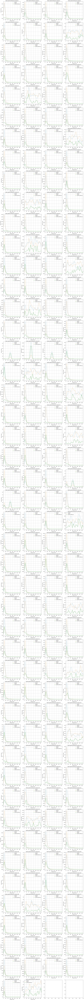

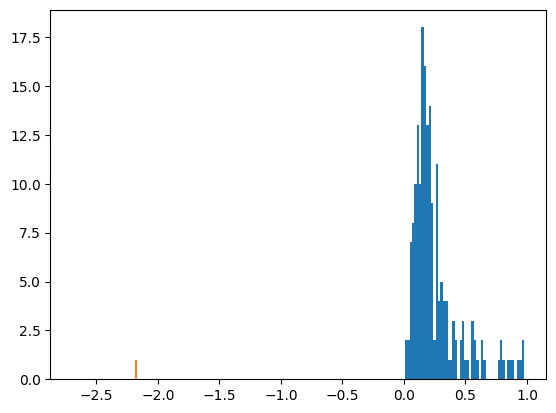

Found 123 relevant channels with alpha=0.25 in a total of 186 channels
[1, 2, 3, 4, 10, 12, 13, 14, 15, 19, 20, 22, 23, 25, 26, 28, 29, 31, 34, 35, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 58, 61, 62, 64, 65, 66, 67, 68, 70, 72, 74, 76, 77, 79, 80, 81, 82, 84, 85, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 110, 112, 113, 114, 117, 118, 119, 121, 122, 123, 125, 126, 128, 129, 130, 131, 134, 135, 136, 137, 138, 141, 142, 143, 144, 146, 147, 148, 149, 151, 153, 158, 159, 160, 162, 165, 166, 168, 170, 173, 175, 176, 177, 178, 180, 183, 184, 185]


100%|██████████| 186/186 [00:08<00:00, 21.08it/s]


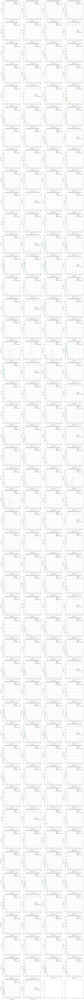

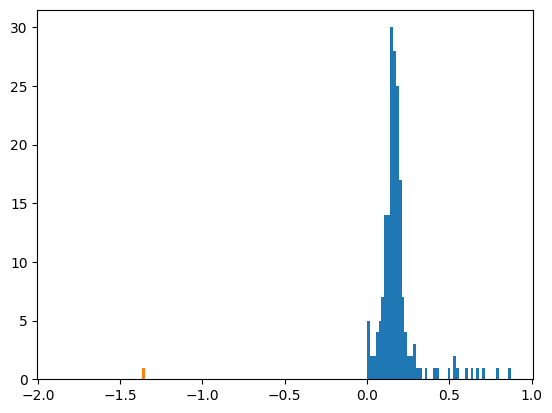

Found 165 relevant channels with alpha=0.25 in a total of 186 channels
[0, 1, 2, 3, 4, 5, 6, 9, 10, 11, 12, 13, 14, 15, 18, 19, 20, 21, 22, 23, 24, 25, 26, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 143, 144, 145, 148, 149, 150, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185]


In [125]:
def get_relevant_channels(participant, alpha=0.05, fs=2048, mean='time', plot=False):
    if mean not in ['time', 'freq']: raise ValueError('mean must be either "time" or "freq"')
    nb_channels = data[participant]['sess1']['neural_data'].shape[0]

    if plot:
        num_cols = 4
        fig_width = 20

        num_rows = int(np.ceil(nb_channels / num_cols))
        fig_height = fig_width * num_rows / num_cols
        _, axs = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height), sharey=False)
        axs = axs.flatten()

    ttests = []
    p_values = []

    for channel_id in tqdm(range(nb_channels)):
        baselines, activities = get_baselines_and_activities(session, channel_id)
        if mean == 'time':
                mean_baseline = np.array(baselines).mean(axis=0)
                mean_activity = np.array(activities).mean(axis=0)
                mean_baseline_psd = welch(mean_baseline, fs=fs)
                mean_activity_psd = welch(mean_activity, fs=fs)
        elif mean == 'freq':
            baselines_psds = []
            activities_psds = []
            for i in range(len(baselines)):
                baselines_psds.append(welch(baselines[i], fs=fs))
                activities_psds.append(welch(activities[i], fs=fs))
            mean_baseline_psd = np.array(baselines_psds).mean(axis=0)
            mean_activity_psd = np.array(activities_psds).mean(axis=0)
        t_stat, p_value = ttest_rel(mean_baseline_psd[1], mean_activity_psd[1])
        ttests.append((t_stat, p_value))
        p_values.append(p_value)
        if plot:
            axs[channel_id].plot(mean_baseline_psd[0], mean_baseline_psd[1], label='baseline', alpha=0.5)
            axs[channel_id].plot(mean_activity_psd[0], mean_activity_psd[1], label='activity', alpha=0.5)
            axs[channel_id].plot(mean_activity_psd[0], abs(mean_baseline_psd[1] - mean_activity_psd[1]), label='absolute difference')
            axs[channel_id].set_title(f'Power spectral density for channel {channel_id}')
            axs[channel_id].set_xlabel('frequency [Hz]')
            axs[channel_id].set_ylabel('PSD [V**2/Hz]')
            axs[channel_id].set_xlim(0, 150)
            axs[channel_id].legend()
            axs[channel_id].grid()

    if plot:
        plt.tight_layout()
        plt.show()

    # _, corrected_p_values, _, _ = multipletests(p_values, alpha=alpha, method='fdr_bh')
    # relevant_channels = [i for i, p in enumerate(corrected_p_values) if p < alpha]
    relevant_channels = [i for i, p in enumerate(p_values) if p < alpha]
    
    if plot:
        plt.hist(p_values, bins=50)
        plt.hist(t_stat, bins=50)
        plt.show()
        print(f'Found {len(relevant_channels)} relevant channels with alpha={alpha} in a total of {nb_channels} channels')

    return relevant_channels, ttests

print(get_relevant_channels(participant, alpha=0.25, plot=True, mean='time')[0])
print(get_relevant_channels(participant, alpha=0.25, plot=True, mean='freq')[0])

In [137]:
def subsample(signal, subsampling):
    step = 2048 // subsampling
    return signal[::step]

def get_channels_for_session(session, relevant_channels):
    channels_dict = {}

    for channel_id in tqdm(relevant_channels):
        signal = session['neural_data'][channel_id]
        # Remove frequencies that are too low (noise) or too high (not eeg-related)
        subsignal = bandpass_filter(signal, 0.5, 150)
        subsignal = subsample(signal, 500)
        # TODO filter electrical noise here

        channels_dict[channel_id] = {
            'signal': signal,
            'subsignal': subsignal,
        }

        # for band_name, (low, high) in FREQ_BANDS.items():
        #     # Bandpass filter the channel
        #     filtered_signal = bandpass_filter(subsignal, low, high)
        #     # Take the envelope of the frequency band with a Hilbert transform
        #     enveloped_channel = hilbert(filtered_signal)
        #     enveloped_channel = np.abs(enveloped_channel)
        #     channels_dict[channel_id][band_name] = enveloped_channel

    return channels_dict


In [138]:
# def get_n_samples(data, participant, session):
    
#     trial_start = data[participant][session]['trials_info']['TS_HandOut']
#     trial_stop = data[participant][session]['trials_info']['TS_HaudBack']
    
#     n_samples = np.zeros(len(trial_start))
    
#     for trial_id in range(len(trial_start)):
#         n_samples[trial_id] = len(data[participant][session]['neural_data'][0, int(trial_start[trial_id] * 500):int(trial_stop[trial_id] * 500)])
        
#     return np.mean(n_samples)

## DOES NOT WORK BECAUSE NOT SUBSAMPLED
def get_n_samples(session):
    
    trial_start = session['trials_info']['TS_HandOut']
    trial_stop = session['trials_info']['TS_HandBack']
    
    n_samples = np.zeros(len(trial_start))
    
    for trial_id in range(len(trial_start)):
        n_samples[trial_id] = len(session['neural_data'][0, int(trial_start[trial_id] * 500):int(trial_stop[trial_id] * 500)])
        
    return np.mean(n_samples)

In [139]:
def get_trials_for_session(session, relevant_channels):
    channels_dict = get_channels_for_session(session, relevant_channels)

    trial_baseline_start = session['trials_info']['TS_TrialStart']
    trial_baseline_stop = session['trials_info']['TS_CueOn']
    trial_start = session['trials_info']['TS_HandOut']
    trial_stop = session['trials_info']['TS_HandBack']
    no_errors = np.array(session['trials_info']['ErrorCode']) == 0

    trials_dict = {}

    for trial_id in range(len(trial_start)):
        if no_errors[trial_id]:
            trials_dict[trial_id] = {}
            for channel_id in relevant_channels:
                subsignal = channels_dict[channel_id]['subsignal']
                subsignal_baseline = subsignal[int((trial_baseline_start[trial_id]) * 500):int((trial_baseline_stop[trial_id] + 1) * 500)]
                baseline_mean = np.mean(subsignal_baseline)
                subsignal_action = subsignal[int(trial_start[trial_id] * 500):int(trial_stop[trial_id] * 500)]
                baseline_corrected_signal = subsignal_action - baseline_mean
                duration_normalized_sigal = resample(baseline_corrected_signal, 1500)
                trials_dict[trial_id][channel_id] = {}
                for band_name, (low, high) in FREQ_BANDS.items():
                    # Bandpass filter the channel
                    filtered_signal = bandpass_filter(duration_normalized_sigal, low, high)
                    # Take the envelope of the frequency band with a Hilbert transform
                    enveloped_channel = hilbert(filtered_signal)
                    enveloped_channel = np.abs(enveloped_channel)
                    trials_dict[trial_id][channel_id][band_name] = enveloped_channel
                    
    print(f'Found {len(trials_dict)} valid trials...')
    return trials_dict

## Observe first element of dictionary

100%|██████████| 4/4 [00:02<00:00,  1.74it/s]


Found 128 valid trials...


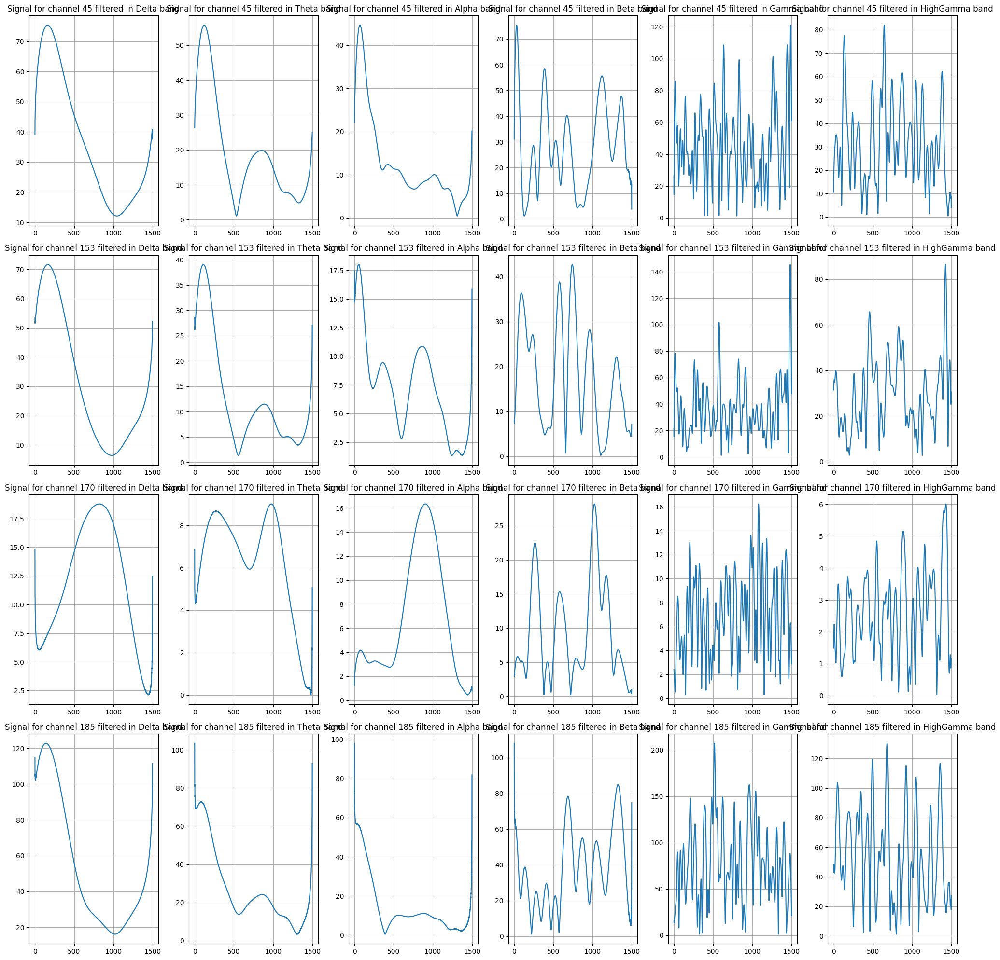

In [140]:
relevant_channels = get_relevant_channels(participant)[0]
trials_dict = get_trials_for_session(session, relevant_channels)

_, axs = plt.subplots(len(relevant_channels), len(FREQ_BANDS), figsize=(20, 20), sharey=False)
for i, channel_id in enumerate(relevant_channels):
    for j, band_name in enumerate(FREQ_BANDS.keys()):
        axs[i, j].plot(trials_dict[1][channel_id][band_name])
        axs[i, j].set_title(f'Signal for channel {channel_id} filtered in {band_name} band')
        axs[i, j].grid()

plt.tight_layout()
plt.show()

## Extract features from those signals

In [ ]:
def get_features_from_session(session, relevant_channels, features = [np.mean, np.std], window_size=1000, step_size=100):
    features_dict = {}
    trials_dict = get_trials_for_session(session, relevant_channels)
    n_samples = 1500

    for channel_id in tqdm(relevant_channels):
        for freq_band in FREQ_BANDS.keys():
            time_idx = 0
            for i in range(n_samples):
                if np.mod(i, step_size) == 0 and i+window_size < n_samples:
                    for feature in features:
                        label = feature.__name__
                        for trial_id in trials_dict.keys():
                            features_dict[f'{channel_id}_{freq_band}_{label}_t{time_idx}'] = feature(trials_dict[trial_id][channel_id][freq_band][i:i+window_size])
                    time_idx += 1 
            

    features_dict['label'] = []
    for trial_id in trials_dict.keys():
        features_dict['label'].append(session['trials_info']['ActionType'][trial_id])

    features_df = pd.DataFrame(features_dict)

    return features_df

## Combine all available session from a single participant

In [142]:
dfs = []
relevant_channels = get_relevant_channels(participant)[0]
for sess in data[participant].keys():
    dfs.append(
        get_features_from_session(
            data[participant][sess],
            relevant_channels,
            features=[np.mean, np.std],
            window_size=100,
            step_size=10
        )
    )

features_df = pd.concat(dfs)

100%|██████████| 4/4 [00:02<00:00,  1.83it/s]


Found 129 valid trials...


100%|██████████| 4/4 [00:01<00:00,  3.19it/s]


Found 128 valid trials...


100%|██████████| 4/4 [00:12<00:00,  3.23s/it]


In [143]:
print(f'The dataset contains {features_df.shape[0]} samples and {features_df.shape[1]} features.')

The dataset contains 257 samples and 6721 features.


## Train a model

In [144]:
from sklearn.decomposition import PCA

X = features_df.drop('label', axis=1)
y = features_df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Normalize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

pca = PCA(n_components=100)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Train SVM
parameters = {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['linear', 'rbf', 'sigmoid']}
svm = SVC()
clf = GridSearchCV(svm, parameters)
clf.fit(X_train_pca, y_train)

# Test SVM
y_pred = clf.predict(X_test_pca)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.44


In [ ]:
from sklearn.decomposition import PCA

X = features_df.drop('label', axis=1)
y = features_df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Normalize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


# Train SVM
parameters = {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['linear', 'rbf', 'sigmoid']}
svm = SVC()
clf = GridSearchCV(svm, parameters)
clf.fit(X_train, y_train)

# Test SVM
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.42


In [152]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

n_estimators = [10, 50, 90, 130]
max_depth = [10, 25, 50]
param_grid = {'n_estimators': n_estimators, 'max_depth': max_depth}

rf = RandomForestClassifier() 
clf = GridSearchCV(rf, param_grid)
clf.fit(X_train, y_train)

# Test SVM
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.42


c:\Users\sarah\miniconda3\envs\ml4scienceTNEproject\Lib\site-packages\numpy\ma\core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


In [150]:
X_train

array([[ 1.05517869, -1.05517869,  1.05517869, ..., -1.05517869,
        -1.05517869, -1.05517869],
       [ 1.05517869, -1.05517869,  1.05517869, ..., -1.05517869,
        -1.05517869, -1.05517869],
       [ 1.05517869, -1.05517869,  1.05517869, ..., -1.05517869,
        -1.05517869, -1.05517869],
       ...,
       [-0.94770678,  0.94770678, -0.94770678, ...,  0.94770678,
         0.94770678,  0.94770678],
       [ 1.05517869, -1.05517869,  1.05517869, ..., -1.05517869,
        -1.05517869, -1.05517869],
       [ 1.05517869, -1.05517869,  1.05517869, ..., -1.05517869,
        -1.05517869, -1.05517869]])